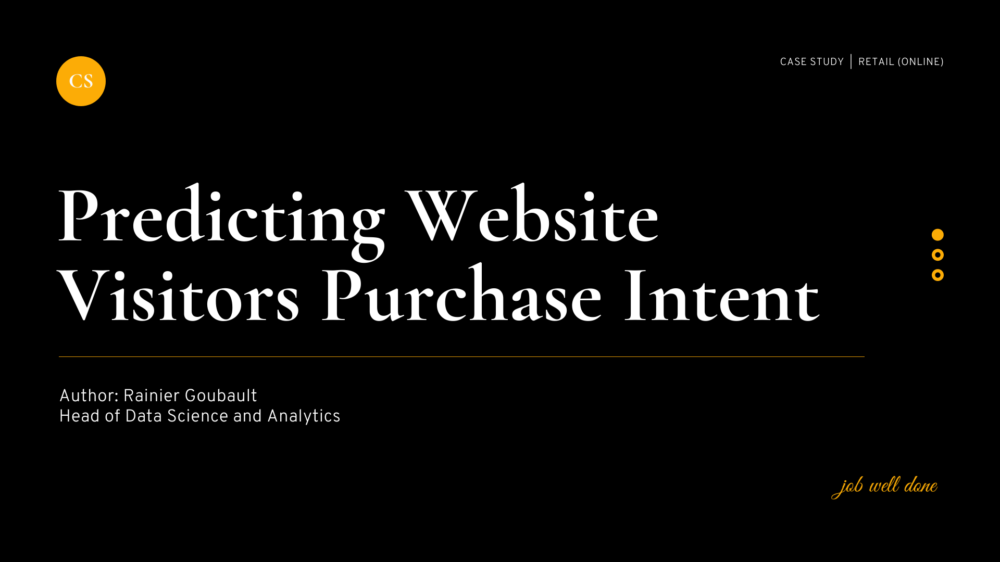

###### LinkedIn: https://www.linkedin.com/in/rainiergoubault/

# Introduction

We have a dataset from an online webstore. Data is formed in such way that each session would correspond to unique user in 1 year period to avoid any tendency, measurings customers intention to finalize transaction, i.e. whether or not session ended with purchase. 

Businesses might be interested in a system which in real time can offer a special offer to customers with positive commercial intention.

# Objective

    1. We aim to accomplish building a prediction model that will classify whether a website visitor 
       (i.e. user/customer) intends to make a purchase on the online webstore.

### Dataset:
The dataset used can be found at: https://archive.ics.uci.edu/ml/datasets/Online+Shoppers+Purchasing+Intention+Dataset

# 1. Gather The Data

In [1]:
# Warning
import warnings
warnings.filterwarnings('ignore')

# Data Manipulation
import numpy as np 
import pandas as pd

# Statistics
from scipy import stats
from scipy.stats import norm, skew
from scipy.stats import mannwhitneyu

# Data Visualisation
import matplotlib.pyplot as plt
import seaborn as sns

import cufflinks as cf

import plotly
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go

from plotly.offline import iplot
from plotly.subplots import make_subplots

# Preprocessing 
from sklearn.compose import make_column_selector as selector
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OrdinalEncoder

# Models
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier

from xgboost import XGBClassifier


# Model Evaluation
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV, RandomizedSearchCV, cross_val_score

# Metrics
from sklearn.metrics import roc_auc_score, confusion_matrix, classification_report, precision_score, recall_score


# Set visualiation options
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

sns.set_style('white')

import plotly.io as pio
pio.renderers.default = 'notebook_connected'

cf.go_offline()

# Set notebook options
pd.set_option('display.max_columns', None) # display all columns
pd.set_option('display.max_rows', 100) # display 100 rows

# Set display options
from sklearn import set_config
set_config(display='diagram')
set_config(print_changed_only=False)

# Export model pipeline diagram to file
from sklearn.utils import estimator_html_repr

%load_ext watermark

In [2]:
# Check the version history of libraries imported
%watermark -iv

json      : 2.0.9
plotly    : 5.4.0
numpy     : 1.21.4
cufflinks : 0.17.3
seaborn   : 0.11.2
matplotlib: 3.5.0
pandas    : 1.3.4
scipy     : 1.7.3



## 1.2 Import The Data

In [3]:
raw_data = pd.read_csv('../02-data/website-visitor-purchase-intent-raw-data.csv')
df = raw_data.copy()
print('The data has been successfully imported!')

The data has been successfully imported!


In [4]:
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

In [6]:
df.shape

(12330, 18)

    - The data contains 12,330 rows and 18 columns 

## 1.3 Data Description

The data was formed in such way that each session would correspond to unique user in 1 year period to avoid any tendency. So, each row represents a unique user and each column a different attribute about the user.


The first six features were derived from the URL information of the pages visited by the user. They were updated each time visitor moved from one page to another till the end of the session.

1. **Administrative:** number of pages about account management visited by person
2. **Administrative Duration:** total amount of time (in seconds) spent by the visitor on administrative pages
3. **Informational:** number of pages in session about Web site, communication and address information of the shopping site
4. **Informational Duration:** time (in seconds) spent on informational pages
5. **Product Related:** number of pages concerning product visited
6. **Product Related Duration:** time (in seconds) spent on product related pages

The next three features were measured by "Google Analytics" for each page in the online webstore.

7. **Bounce Rates:** average bounce rate value of the pages visited by the visitor. Bounce rate itself is percentage of visitors who enter the site from that page and then leave
8. **Exit Rates:** average exit rate value of the pages visited by the visitor. Value of exit rate for page is percentage of all views of this page that were last in the session
9. **Page Values:** average page value of the pages visited. Indicates how valuable a specific page is to shop holder in monetary terms
10. **Special Day:** Closeness of the site visiting time to a special day. The value of this attribute is determined by considering the dynamics of e-commerce such as the duration between the order date and delivery date. 

        For example, Valentine’s day, this value takes a nonzero value between February 2 and February 12, 
        zero before and after this date unless it is close to another special day, and its maximum value of
        1 on February 8.

11. **Month:** month  of the visit 
12. **Operating Systems:** operating system of the visitor
13. **Browser:** browser of the visitor
14. **Region:** geographic region from which the session has been started by the visitor
15. **Traffic Type:** traffic source by which the visitor has arrived at the Web site (e.g., banner, SMS, direct)
16. **Visitor Type:** whether the visitor is the new or returning (or not specified)
17. **Weekend:** whether the date of the visit is on a weekend
   
The last feature is our target feature:

18. **Revenue:** measures user intention to finalize transaction, i.e. whether or not session ended with purchase


### Data Types

In [7]:
print('Count of Features by Data Type:')
df.dtypes.value_counts()

Count of Features by Data Type:


int64      7
float64    7
object     2
bool       2
dtype: int64

### Constant Values

In [8]:
constant_values = df.nunique()
constant_values = [i for i,v in enumerate(constant_values) if v ==1]
constant_values

[]

    - The data contain no constant values

### Duplicate Values

In [9]:
duplicates = df.duplicated()

In [10]:
print(f'The number of duplicate values in the data: {duplicates.sum()}')

The number of duplicate values in the data: 125


In [11]:
# Drop duplicate values in the data
df.drop_duplicates(inplace=True)

In [12]:
print(f'The number of duplicate values in the data: {df.duplicated().sum()}')

The number of duplicate values in the data: 0


In [13]:
df.shape

(12205, 18)

    - As we see above, the 125 duplicate values were indeed dropped from the data
    - We now have 12,205 rows of data

### Missing Values

In [14]:
missing = df.isna()
print(f'Does the data contain missing values:\n\n{missing.any()}')

Does the data contain missing values:

Administrative             False
Administrative_Duration    False
Informational              False
Informational_Duration     False
ProductRelated             False
ProductRelated_Duration    False
BounceRates                False
ExitRates                  False
PageValues                 False
SpecialDay                 False
Month                      False
OperatingSystems           False
Browser                    False
Region                     False
TrafficType                False
VisitorType                False
Weekend                    False
Revenue                    False
dtype: bool


    - The data contains no missin values

# 2. Exploratory Data Analysis

## 2.1 Target Feature - **Revenue**

The **'Revenue'** feature is a measure of whether or not a visitor (ie. user/customer) made a purchase or not. 
    
    - True denotes a purchase did happen
    - False denotes a purchase did not happen

In [15]:
target = pd.DataFrame(df['Revenue'])

### Statistical Summary

In [16]:
target.describe()

,Revenue
count,12205
unique,2
top,False
freq,10297


- The target feature **'Revenue'** is not missing any values
- There are 2 unique values
- The most frequent unique value is **False** with a count of **10,297** values

Let's look at the sum and percentage distribution of the target feature.

In [17]:
target_sum = target.value_counts()
target_percent = target.value_counts(normalize=True)
print(f'The sum distribution of the target variable:\n\n{target_sum}\n')
print(f'The percentage distribution of the target variable:\n\n{target_percent}')

The sum distribution of the target variable:

Revenue
False      10297
True        1908
dtype: int64

The percentage distribution of the target variable:

Revenue
False      0.843671
True       0.156329
dtype: float64


We note the following findings:

    - There are more visitors who didn't purchase (84%) than those that did purchase (15%). Not surprising.
    - We are dealing with imbalanced classes.

Let's visualize the distribution of the target feature.

In [18]:
labels = ['Non-Purchase', 'Purchase']
values = df['Revenue'].value_counts()

fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.1)])
fig.update_layout(title_text='<b>Target Feature Distribution<b>')
fig.show()

## 2.2 Numerical Features

In [19]:
# Get numerical features
num = df.select_dtypes(include='number').columns

In [20]:
# Check the shape of numerical features
df[num].shape

(12205, 14)

    - We have 14 numerical features

In [21]:
# Look at numerical features
df[num].head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,OperatingSystems,Browser,Region,TrafficType
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,1,1,1,1
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,2,2,1,2
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,4,1,9,3
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,3,2,2,4
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,3,3,1,4


In [22]:
df[num].dtypes.value_counts()

int64      7
float64    7
dtype: int64

## Univariate Analysis

### Statistical Summary

In [23]:
df[num].describe().T

,count,mean,std,min,25%,50%,75%,max
Administrative,12205.0,2.338878,3.330436,0.0,0.000000,1.000000,4.000000,27.000000
Administrative_Duration,12205.0,81.646331,177.491845,0.0,0.000000,9.000000,94.700000,3398.750000
Informational,12205.0,0.508726,1.275617,0.0,0.000000,0.000000,0.000000,24.000000
Informational_Duration,12205.0,34.825454,141.424807,0.0,0.000000,0.000000,0.000000,2549.375000
ProductRelated,12205.0,32.045637,44.593649,0.0,8.000000,18.000000,38.000000,705.000000
ProductRelated_Duration,12205.0,1206.982457,1919.601400,0.0,193.000000,608.942857,1477.154762,63973.522230
BounceRates,12205.0,0.020370,0.045255,0.0,0.000000,0.002899,0.016667,0.200000
ExitRates,12205.0,0.041466,0.046163,0.0,0.014231,0.025000,0.048529,0.200000
PageValues,12205.0,5.949574,18.653671,0.0,0.000000,0.000000,0.000000,361.763742
SpecialDay,12205.0,0.061942,0.199666,0.0,0.000000,0.000000,0.000000,1.000000


### Uniques

In [24]:
# Find how many unique values numerical features have
for feature in df[num]:
    print(f'{feature} feature has {df[feature].nunique()} unique values.')

Administrative feature has 27 unique values.
Administrative_Duration feature has 3335 unique values.
Informational feature has 17 unique values.
Informational_Duration feature has 1258 unique values.
ProductRelated feature has 311 unique values.
ProductRelated_Duration feature has 9551 unique values.
BounceRates feature has 1872 unique values.
ExitRates feature has 4777 unique values.
PageValues feature has 2704 unique values.
SpecialDay feature has 6 unique values.
OperatingSystems feature has 8 unique values.
Browser feature has 13 unique values.
Region feature has 9 unique values.
TrafficType feature has 20 unique values.


### Distributions

In [25]:
# Plot numerical features distribution
fig = df[num].iplot(kind='hist', subplots=True, bins=50,
                     title='<b>Histogram Distribution of Numerical Features<b>')
fig

    - Numerical features have different magnitudes of scales
    - Numerical features are right skewed
    - Some features are categorical and have been label-encoded, we'll change their dtype for easier EDA.

In [26]:
object_feats = ['OperatingSystems', 'Browser', 'Region', 'TrafficType']

for feature in object_feats:
    df[feature] = df[feature].astype('object')

In [27]:
# Let's check if dtyped was changed
df[object_feats].dtypes

OperatingSystems    object
Browser             object
Region              object
TrafficType         object
dtype: object

    - The data types were indeed changed.

In [28]:
# Re-get numerical features 
num = df.select_dtypes(include='number').columns

In [29]:
# Get the sum of numerical dtypes 
df[num].dtypes.value_counts()

float64    7
int64      3
dtype: int64

In [30]:
# Re-plot numerical features distribution
fig = df[num].iplot(kind='hist', subplots=True, bins=50,
                     title='<b>Histogram Distribution of Numerical Features<b>')
fig

### Skew & Kurt

In [31]:
skew_limit = 0.75
skew_vals = df[num].skew()
skew_feats = skew_vals[abs(skew_vals) > skew_limit]
skew_feats = pd.DataFrame(skew_feats, columns=['Skew'])
skew_feats.sort_values(by='Skew', ascending=False, inplace=True)
skew_feats

,Skew
Informational_Duration,7.540291
ProductRelated_Duration,7.253161
PageValues,6.350983
Administrative_Duration,5.592152
ProductRelated,4.333419
Informational,4.014173
SpecialDay,3.285902
BounceRates,3.162425
ExitRates,2.234645
Administrative,1.947123


In [32]:
kurt_limit = 1
kurt_vals = df[num].kurt()
kurt_feats = kurt_vals[abs(kurt_vals) > kurt_limit]
kurt_feats = pd.DataFrame(kurt_feats, columns=['Kurt'])
kurt_feats.sort_values(by='Kurt', ascending=False, inplace=True)
kurt_feats

,Kurt
ProductRelated_Duration,136.681451
Informational_Duration,75.534235
PageValues,64.998027
Administrative_Duration,50.136788
ProductRelated,31.072712
Informational,26.659273
SpecialDay,9.797646
BounceRates,9.333988
ExitRates,4.642070
Administrative,4.641357


### Bivariate Analysis (vs. Target Feature)

In [33]:
df.groupby(by='Revenue')[num].describe()

Administrative                                                \
                 count      mean       std  min  25%  50%  75%   max   
Revenue                                                                
False          10297.0  2.143440  3.213298  0.0  0.0  1.0  3.0  27.0   
True            1908.0  3.393606  3.730527  0.0  0.0  2.0  5.0  26.0   

        Administrative_Duration                                               \
                          count        mean         std  min  25%        50%   
Revenue                                                                        
False                   10297.0   74.635276  171.858685  0.0  0.0   0.000000   
True                     1908.0  119.483244  201.114732  0.0  0.0  52.366667   

                             Informational                                     \
                75%      max         count      mean       std  min  25%  50%   
Revenue                                                                         
False     84.550000  3398.75       10297.0  0.457318  1.217885  0.0  0.0  0.0   
True     151.083333  2086.75        1908.0  0.786164  1.521176  0.0  0.0  0.0   

                   Informational_Duration                                   \
         75%   max                  count       mean         std  min  25%   
Revenue                                                                      
False    0.0  24.0                10297.0  30.603289  134.678026  0.0  0.0   
True     1.0  12.0                 1908.0  57.611427  171.619131  0.0  0.0   

                                ProductRelated                             \
         50%   75%          max          count       mean        std  min   
Revenue                                                                     
False    0.0   0.0  2549.375000        10297.0  29.050403  40.876473  0.0   
True     0.0  19.0  1767.666667         1908.0  48.210168  58.267365  0.0   

                                 ProductRelated_Duration               \
          25%   50%   75%    max                   count         mean   
Revenue                                                                 
False     7.0  16.0  35.0  705.0                 10297.0  1082.976881   
True     15.0  29.0  57.0  534.0                  1908.0  1876.209615   

                                                                            \
                 std  min        25%         50%          75%          max   
Revenue                                                                      
False    1810.834046  0.0  159.50000   526.00000  1345.755952  63973.52223   
True     2312.214392  0.0  541.90625  1109.90625  2266.011310  27009.85943   

        BounceRates                                                         \
              count      mean       std  min  25%       50%       75%  max   
Revenue                                                                      
False       10297.0  0.023197  0.048466  0.0  0.0  0.003922  0.019259  0.2   
True         1908.0  0.005117  0.012185  0.0  0.0  0.000000  0.006452  0.2   

        ExitRates                                                              \
            count      mean       std  min       25%       50%       75%  max   
Revenue                                                                         
False     10297.0  0.045526  0.048685  0.0  0.015385  0.028382  0.051538  0.2   
True       1908.0  0.019555  0.016463  0.0  0.009521  0.016000  0.025000  0.2   

        PageValues                                                             \
             count       mean        std  min       25%        50%        75%   
Revenue                                                                         
False      10297.0   1.999985   9.124701  0.0  0.000000   0.000000   0.000000   
True        1908.0  27.264518  35.191954  0.0  3.641144  16.758134  38.897742   

                    SpecialDay                                               
                max      

In [34]:
df['Revenue'] = df['Revenue'].astype('int64')

In [35]:
# Get numerical features + target feature to list
num_target = df.select_dtypes(include='number').columns

# Check the list of features
num_target

Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay', 'Revenue'],
      dtype='object')

In [36]:
for feature in df[num]:
    fig = px.box(df[num_target], x='Revenue', y=feature,
                 title=f'<b>{feature} Distribution by Revenue<b>')
    fig.show()

### Relationships

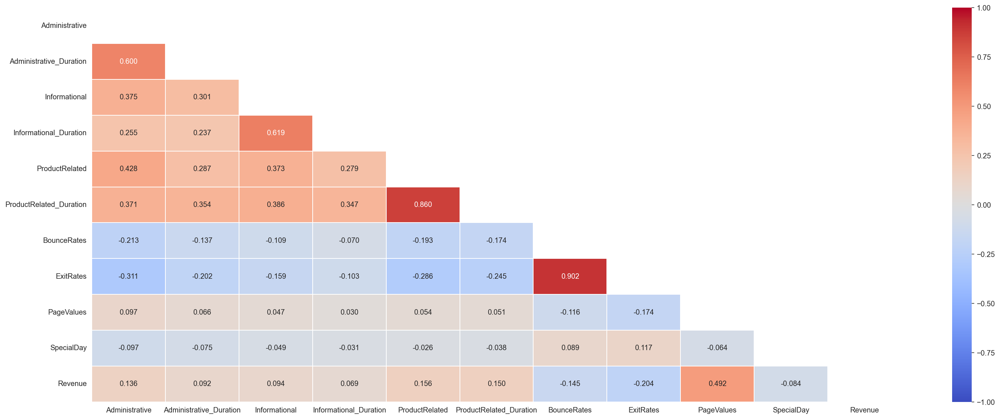

In [37]:
plt.figure(figsize=(25, 10))

corr_matrix = df[num_target].corr()

mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

ax = sns.heatmap(corr_matrix, 
                 mask=mask, 
                 xticklabels=corr_matrix.columns, 
                 yticklabels=corr_matrix.columns, 
                 annot=True,
                 fmt='.3f',
                 linewidths=.2, 
                 cmap='coolwarm', 
                 vmin=-1, vmax=1);

    - Most numerical features have low correlation
    - 'ProductRelatedDuration' and 'ProductRelated' features are highly correlated
    - The same for 'ExitRates' and 'BounceRates' features
    - 'PageValues' seems to have a somewhat strong correlation with 'Revenue'

## 2.3 Categorical Features

In [38]:
# Get categorical features
cat = df.select_dtypes(include='object').columns

In [39]:
df[cat].shape

(12205, 6)

    - We have 6 categorical features

In [40]:
# Let look at categorical features
df[cat].head()

,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType
0,Feb,1,1,1,1,Returning_Visitor
1,Feb,2,2,1,2,Returning_Visitor
2,Feb,4,1,9,3,Returning_Visitor
3,Feb,3,2,2,4,Returning_Visitor
4,Feb,3,3,1,4,Returning_Visitor


In [41]:
df[cat].dtypes.value_counts()

object    6
dtype: int64

## Univariate Analysis

### Statistical Summary

In [42]:
df[cat].describe().T

,count,unique,top,freq
Month,12205,10,May,3329
OperatingSystems,12205,8,2,6541
Browser,12205,13,2,7883
Region,12205,9,1,4714
TrafficType,12205,20,2,3911
VisitorType,12205,3,Returning_Visitor,10431


As we see, some features have already been label-encoded. Some are stll in string format. 

- The categorical features are not missing any values
- **Month** has 10 unique values, May is the most frequent value with a count of 3329
- **Operating Systems** has 8 unique values, 2 is the most frequent value with a count of 6541
- **Browser** has 13 unique values, 2 is the most frequent value with a count of 7883
- **Region** has 9 unique values, 1 is the most frequent value with a count of 4714
- **Traffic Type** has 20 unique values, 2 is the most frequent value with a count of 3991
- **Visitor Type** has 3 unique values, Returning Visitor is the most frequent value with a count of 10431

### Uniques

In [43]:
# Find how many unique values numerical features have
for feature in df[cat]:
    print(f'{feature} has {df[feature].nunique()} unique values.')
    print(f'{df[feature].unique()}\n') 

Month has 10 unique values.
['Feb' 'Mar' 'May' 'Oct' 'June' 'Jul' 'Aug' 'Nov' 'Sep' 'Dec']

OperatingSystems has 8 unique values.
[1 2 4 3 7 6 8 5]

Browser has 13 unique values.
[1 2 3 4 5 6 7 10 8 9 12 13 11]

Region has 9 unique values.
[1 9 2 3 4 5 6 7 8]

TrafficType has 20 unique values.
[1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 18 19 16 17 20]

VisitorType has 3 unique values.
['Returning_Visitor' 'New_Visitor' 'Other']



### Distribution

In [44]:
fig = df[cat].iplot(kind='hist', subplots=True,
                      title='<b>Histogram Distribution of Categorical Features<b>')
fig

Let's not some interesting finding:

- **Month** feature is missing the months of January and April.
- **Visitor Type** feature has 3 values - Returning Visitor, New Visitor and Other. What is meant by Other?

In [45]:
df['VisitorType'].value_counts()

Returning_Visitor    10431
New_Visitor           1693
Other                   81
Name: VisitorType, dtype: int64

    - There are only 85 instances of Other. 

### Bivariate Analysis (vs. Target Feature)

In [46]:
df.groupby('Revenue')[cat].describe().T

Revenue                                  0                  1
Month            count               10297               1908
                 unique                 10                 10
                 top                   May                Nov
                 freq                 2964                760
OperatingSystems count               10297               1908
                 unique                  8                  8
                 top                     2                  2
                 freq                 5386               1155
Browser          count               10297               1908
                 unique                 13                 12
                 top                     2                  2
                 freq                 6660               1223
Region           count               10297               1908
                 unique                  9                  9
                 top                     1                  1
                 freq                 3943                771
TrafficType      count               10297               1908
                 unique                 20                 16
                 top                     2                  2
                 freq                 3064                847
VisitorType      count               10297               1908
                 unique                  3                  3
                 top     Returning_Visitor  Returning_Visitor
                 freq                 8961               1470

In [47]:
for value, feature in enumerate(df[cat]):
    fig = px.histogram(df[feature], color=df['Revenue'], barmode='group', 
                       title=f'<b>{feature} by Revenue<b>')
    fig.show()

### Relationships

In [48]:
from sklearn.metrics import mutual_info_score

def cat_mut_inf(series):
    return mutual_info_score(series, df['Revenue']) 

cat_mut_info = df[cat].apply(cat_mut_inf) 
cat_mut_info = cat_mut_info.sort_values(ascending=False).to_frame(name='Mutual Info Score') 
cat_mut_info

,Mutual Info Score
TrafficType,0.015393
Month,0.015243
VisitorType,0.004808
OperatingSystems,0.003248
Browser,0.001258
Region,0.000402


# 3. Data Preparation

In [49]:
df = raw_data.copy()
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


In [50]:
df.shape

(12330, 18)

### Data Types

The data contains 2 boolean dtype features - **'Weekend'** and **'Revenue'**. First, we'll convert boolean features to binary type

In [51]:
# Get sum of data dtypes 
df.dtypes.value_counts()

int64      7
float64    7
object     2
bool       2
dtype: int64

In [52]:
# Convert bool dtypes to numerical dtypes
for feature in df.columns:
    dtype = df[feature].dtype
    if dtype == 'bool':
        df[feature] = df[feature].astype('int64')

In [53]:
df.dtypes.value_counts()

int64      9
float64    7
object     2
dtype: int64

### Duplicates

During EDA, we noticed that the data contained duplicates. Let's drop duplicate values from the data.

In [54]:
df.drop_duplicates(inplace=True)
df.shape

(12205, 18)

### Data Cleaning

#### 'VisitorType'

During EDA, we noticed that **'Visitor Type** feature had 81 instances as 'Other'. This didn't make any sense, so we will drop these from the data.

In [55]:
df['VisitorType'].value_counts()

Returning_Visitor    10431
New_Visitor           1693
Other                   81
Name: VisitorType, dtype: int64

In [56]:
df.drop(df.loc[df.VisitorType=='Other'].index, inplace=True)

In [57]:
df['VisitorType'].value_counts()

Returning_Visitor    10431
New_Visitor           1693
Name: VisitorType, dtype: int64

    - We dropped all 81 instances as 'Other' from the 'Visitor Type' feature from the data. 

In [58]:
df.shape

(12124, 18)

    - The data now has 12124 instances. We still have all 18 features.

In [59]:
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,0,0
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,0,0
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,0,0
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,0,0
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,1,0


In [60]:
# Save cleaned-up data to csv
df.to_csv('../02-data/website-visitor-purchase-intent-clean-data.csv', index=False)
print('CSV file saved!!')

CSV file saved!!


In [61]:
clean_data = pd.read_csv('../02-data/website-visitor-purchase-intent-clean-data.csv')
df = clean_data.copy()
print('The data has been successfully imported!')

The data has been successfully imported!


In [62]:
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,0,0
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,0,0
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,0,0
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,0,0
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,1,0


### Split the data into train and test set

In [63]:
train, test = train_test_split(df, test_size=.10, random_state=999)
print('The shape of the train set:', train.shape)
print('The shape of the test set:', test.shape)

The shape of the train set: (10911, 18)
The shape of the test set: (1213, 18)


In [64]:
# Save train and test set to csv
train.to_csv('../02-data/website-visitor-purchase-intent-clean-train.csv', index=False)
test.to_csv('../02-data/website-visitor-purchase-intent-clean-test.csv', index=False)
print('CSV file saved!!')

CSV file saved!!


    - The data was split into train and test set, with 10% of the data for the test set.
    - Train set contain 10,901 rows and is what we'll use to train the model.
    - Test set contain 1,213 rows and is what we'll use (i.e. new data) to test our already trained model.

### Parition the train data into features (X) and target (y)

In [65]:
X = train.drop(['Revenue'], axis=1)
y = train['Revenue']
print('The shape of X:', X.shape)
print('The shape of y:', y.shape)

The shape of X: (10911, 17)
The shape of y: (10911,)


### Split into training and testing sets

In [66]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, stratify=y, random_state=999)
print(X_train.shape, X_test.shape)
print(y_train.shape, y_test.shape)

(7637, 17) (3274, 17)
(7637,) (3274,)


# Metric Selection

As we saw during EDA, the target feature **'Revenue'** is imbalanced.

The exact metric used and the threshold that our model needs to reach depends on the business need.

We'll use:

**ROC AUC** metric to evaluate the model. 
    
    - Probabilities for class can be considered as intention scores and the threshold can be adjusted 
      to degree of visitor intention.

We'll also look at the Precision and Recall metrics on the test set.

# Modeling

In [67]:
%%time

# Define categorical preprocessing
oe = OrdinalEncoder(handle_unknown="use_encoded_value", unknown_value=-1)
cat_preprocessor = Pipeline([('oridnal_encode', oe)])

# Combine num and cat preprocessing
ct = ColumnTransformer([('categorical features', cat_preprocessor, selector(dtype_include='object'))],
                       remainder = 'passthrough')

# Instantiate Models
models = [DecisionTreeClassifier(random_state=999), RandomForestClassifier(random_state=999), 
          XGBClassifier(random_state=999, use_label_encoder=False), GradientBoostingClassifier(random_state=999)]

# Models Evaluation Strategy
skfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=999)
metric = 'roc_auc'

scores = []
model_name = []

for model in models:
    # Define model pipeline
    pipe = Pipeline([('preprocessing', ct), ('model', model)])
    
    # CV model pipeline
    cv_scores = cross_val_score(pipe, X=X_train, y=y_train, 
                                scoring=metric, cv=skfold, n_jobs=-1, error_score='raise').mean() 
    # Fit model pipeline
    pipe.fit(X_train, y_train)
    
    # Predict model pipeline
    y_pred = pipe.predict(X_test)
    y_predproba = pipe.predict_proba(X_test)[:,1]
    
    # Append name of model and scores 
    model_name.append(model.__class__.__name__)
    scores.append(({
        'ROC-AUC': round(roc_auc_score(y_test, y_predproba) * 100, 2),
        'CV ROC-AUC': round(cv_scores * 100, 2),
        'Precision': round(precision_score(y_test, y_pred) * 100, 2),
        'Recall': round(recall_score(y_test, y_pred) * 100, 2)
    })) 
    
    # Print model and score 
    print(f'\nModel: {model}\n')
    print(f'ROC-AUC test score: {round(roc_auc_score(y_test, y_predproba) * 100 , 2)}%')
    print(f'ROC-AUC mean CV score: {round(cv_scores * 100, 2)}%\n')
    print(40 * '-')
    print()


Model: DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       random_state=999, splitter='best')

ROC-AUC test score: 73.57%
ROC-AUC mean CV score: 73.4%

----------------------------------------


Model: RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=None, oob_score=False,
                       random_state=999, verbose=0, warm_start=False)

ROC-AUC test score: 92.69%
RO

In [68]:
baseline_model_name = ['Baseline_DecisionTree', 'Baseline_RandomForest', 'Baseline_XGBoost', 'Baseline_GradientBoosting']
baseline_models_result = pd.DataFrame(data=scores, columns=['CV ROC-AUC', 'ROC-AUC', 'Precision', 'Recall'], 
                                      index=baseline_model_name)

baseline_models_result.sort_values(by=['CV ROC-AUC'], ascending=False, inplace=True)
baseline_models_result

,CV ROC-AUC,ROC-AUC,Precision,Recall
Baseline_GradientBoosting,92.79,92.97,72.16,60.51
Baseline_RandomForest,91.91,92.69,73.88,57.78
Baseline_XGBoost,91.29,92.04,69.77,58.37
Baseline_DecisionTree,73.40,73.57,53.52,56.23


In [69]:
baseline_models_result['CV ROC-AUC'].iplot(kind='bar',
                                           title='<b>Model Comparison by CV ROC-AUC<b>')

## Tune Gradient Boosting Model

In [70]:
# Define model pipeline 
gbc_pipe = Pipeline([
    ('preprocessing', ct),
    ('model', GradientBoostingClassifier(random_state=999))
])

# Define model pipeline parameter grid
gbc_param_grid = {
    'model__learning_rate': np.logspace(-4, 0),
    'model__max_depth': np.arange(2, 6),
    'model__n_estimators': np.arange(100, 1000),
    'model__subsample': np.linspace(0.1 ,1, 10)
}

In [71]:
%%time
gbc_rs = RandomizedSearchCV(estimator=gbc_pipe,
                            param_distributions=gbc_param_grid,
                            n_iter=10,
                            scoring=metric,
                            n_jobs=-1,
                            cv=skfold,
                            verbose=1,
                            random_state=999,
                            error_score='raise',
                            return_train_score=True)

gbc_rs.fit(X_train, y_train);

Fitting 10 folds for each of 10 candidates, totalling 100 fits
CPU times: user 7.04 s, sys: 64.4 ms, total: 7.11 s
Wall time: 1min 43s


RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=999, shuffle=True),
                   error_score='raise',
                   estimator=Pipeline(memory=None,
                                      steps=[('preprocessing',
                                              ColumnTransformer(n_jobs=None,
                                                                remainder='passthrough',
                                                                sparse_threshold=0.3,
                                                                transformer_weights=None,
                                                                transformers=[('categorical '
                                                                               'features',
                                                                               Pipeline(memory=None,
                                                                                        steps=[('oridnal_encode',
                                                                                                OrdinalEn...
       945, 946, 947, 948, 949, 950, 951, 952, 953, 954, 955, 956, 957,
       958, 959, 960, 961, 962, 963, 964, 965, 966, 967, 968, 969, 970,
       971, 972, 973, 974, 975, 976, 977, 978, 979, 980, 981, 982, 983,
       984, 985, 986, 987, 988, 989, 990, 991, 992, 993, 994, 995, 996,
       997, 998, 999]),
                                        'model__subsample': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ])},
                   pre_dispatch='2*n_jobs', random_state=999, refit=True,
                   return_train_score=True, scoring='roc_auc', verbose=1)

In [72]:
gbc_best_params = gbc_rs.best_params_
gbc_best_score = gbc_rs.best_score_

model_name = 'Gradient Boosting'
print(f'Best parameters for {model_name} model:\n{gbc_best_params}\n')
print(f'Best mean CV ROC-AUC score: {(gbc_best_score * 100):.2f}%')

Best parameters for Gradient Boosting model:
{'model__subsample': 0.8, 'model__n_estimators': 697, 'model__max_depth': 3, 'model__learning_rate': 0.033932217718953266}

Best mean CV ROC-AUC score: 92.75%


In [73]:
print(f'{model_name} model results:')
gbc_results = pd.DataFrame(gbc_rs.cv_results_).sort_values(by='rank_test_score', ascending=True)
gbc_results.head()

Gradient Boosting model results:


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__subsample,param_model__n_estimators,param_model__max_depth,param_model__learning_rate,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
3,11.363496,0.327216,0.017358,0.000651,0.8,697,3,0.033932,"{'model__subsample': 0.8, 'model__n_estimators...",0.941589,0.914221,0.918983,0.928688,0.944992,0.937694,0.908709,0.916175,0.931143,0.932582,0.927478,0.011744,1,0.966972,0.968092,0.969301,0.968712,0.967225,0.968161,0.969427,0.969316,0.968079,0.967578,0.968286,0.000838
9,12.339717,1.518641,0.027206,0.004310,0.4,905,5,0.009103,"{'model__subsample': 0.4, 'model__n_estimators...",0.938665,0.918944,0.917340,0.926682,0.941188,0.935611,0.907246,0.916240,0.930728,0.934798,0.926744,0.010723,2,0.974705,0.974905,0.975837,0.975849,0.974348,0.974716,0.976250,0.975948,0.975263,0.975170,0.975299,0.000607
5,1.787127,0.012423,0.013581,0.000735,0.2,187,5,0.001389,"{'model__subsample': 0.2, 'model__n_estimators...",0.933191,0.912992,0.919539,0.930195,0.942120,0.933036,0.903015,0.914922,0.929186,0.932932,0.925113,0.011362,3,0.941317,0.943874,0.942918,0.942151,0.939474,0.940548,0.944324,0.943414,0.941668,0.940794,0.942048,0.001493
0,1.164793,0.052761,0.010982,0.001513,0.3,111,4,0.009103,"{'model__subsample': 0.30000000000000004, 'mod...",0.932065,0.913425,0.918685,0.931075,0.943879,0.934705,0.900582,0.913546,0.929756,0.931013,0.924873,0.012237,4,0.937062,0.938697,0.938973,0.937589,0.935427,0.936119,0.939765,0.938365,0.937011,0.936847,0.937586,0.001284
4,19.511440,0.128465,0.035383,0.000728,0.8,778,5,0.000176,"{'model__subsample': 0.8, 'model__n_estimators...",0.934084,0.913910,0.919009,0.928539,0.936452,0.931366,0.899871,0.915138,0.929815,0.930340,0.923852,0.010922,5,0.942363,0.944244,0.945276,0.943166,0.943083,0.942445,0.946990,0.944149,0.943592,0.943303,0.943861,0.001332


In [74]:
# Make predictions with best model estimator
gbc_pred = gbc_rs.best_estimator_.predict(X_test)
gbc_prob = gbc_rs.best_estimator_.predict_proba(X_test)[:, 1]

# Evaluate model predictions
gbc_roc_auc = roc_auc_score(y_test, gbc_prob) * 100
gbc_precision = precision_score(y_test, gbc_pred) * 100
gbc_recall = recall_score(y_test, gbc_pred) * 100
print(f'Best ROC-AUC test score: {gbc_roc_auc:.2f}%')
print(f'Best Precision test ccore: {gbc_precision:.2f}%')
print(f'Best Recall test score: {gbc_recall:.2f}%')

Best ROC-AUC test score: 92.85%
Best Precision test ccore: 71.46%
Best Recall test score: 58.95%


In [75]:
best_gbc_result = pd.DataFrame(columns=['CV ROC-AUC', 'ROC-AUC', 'Precision', 'Recall'], 
                                 index=['Tuned_GradientBoosting'])

best_gbc_result.loc['Tuned_GradientBoosting', 'CV ROC-AUC'] = round(gbc_best_score *100, 2)
best_gbc_result.loc['Tuned_GradientBoosting', 'ROC-AUC'] = round(gbc_roc_auc, 2)
best_gbc_result.loc['Tuned_GradientBoosting', 'Precision'] = round(gbc_precision, 2)
best_gbc_result.loc['Tuned_GradientBoosting', 'Recall'] = round(gbc_recall, 2)
best_gbc_result

,CV ROC-AUC,ROC-AUC,Precision,Recall
Tuned_GradientBoosting,92.75,92.85,71.46,58.95


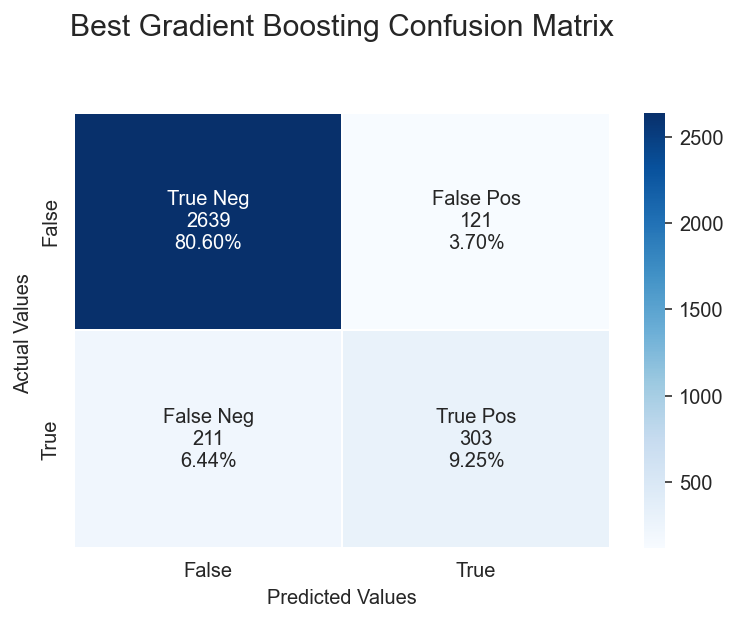

In [76]:
gbc_cm = confusion_matrix(y_test, gbc_pred)

group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']

group_sum = ['{0:0.0F}'.format(value) for value in gbc_cm.flatten()]

group_percent = ['{0:.2%}'.format(value) for value in 
                 gbc_cm.flatten()/np.sum(gbc_cm)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in
         zip(group_names, group_sum, group_percent)]

labels = np.asarray(labels).reshape(2,2)

ax = sns.heatmap(gbc_cm, annot=labels, fmt='', linewidths=0.75, cmap='Blues')

ax.set_title(f'Best {model_name} Confusion Matrix\n\n', size=15);
ax. set_xlabel("Predicted Values")
ax. set_ylabel('Actual Values ');
#
# Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False', 'True'])
ax.yaxis.set_ticklabels(['False', 'True']);

In [77]:
print(f'Best {model_name} model saved!')
tuned_gbc_model = gbc_rs.best_estimator_
tuned_gbc_model

Best Gradient Boosting model saved!


Pipeline(memory=None,
         steps=[('preprocessing',
                 ColumnTransformer(n_jobs=None, remainder='passthrough',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('categorical features',
                                                  Pipeline(memory=None,
                                                           steps=[('oridnal_encode',
                                                                   OrdinalEncoder(categories='auto',
                                                                                  dtype=<class 'numpy.float64'>,
                                                                                  handle_unknown='use_encoded_value',
                                                                                  unknown_value=-1))],
                                                           verbo...
                                            criterion='friedman_mse', init=None,
                                            learning_rate=0.033932217718953266,
                                            loss='deviance', max_depth=3,
                                            max_features=None,
                                            max_leaf_nodes=None,
                                            min_impurity_decrease=0.0,
                                            min_samples_leaf=1,
                                            min_samples_split=2,
                                            min_weight_fraction_leaf=0.0,
                                            n_estimators=697,
                                            n_iter_no_change=None,
                                            random_state=999, subsample=0.8,
                                            tol=0.0001, validation_fraction=0.1,
                                            verbose=0, warm_start=False))],
         verbose=False)

## Tune Random Forest Model

In [78]:
# Define model pipeline 
rf_pipe = Pipeline([
    ('preprocessing', ct),
    ('model', RandomForestClassifier(random_state=999))
])

# Define model pipeline parameter grid
rf_param_grid = {
    'model__max_depth': np.arange(2, 6),
    'model__max_features': [1,'auto','log2'],
    'model__min_samples_leaf': [1, 2, 3],
    'model__min_samples_split': [2, 3, 4],
    'model__n_estimators': np.arange(100, 1000)
}

In [79]:
%%time
rf_rs = RandomizedSearchCV(estimator=rf_pipe,
                            param_distributions=rf_param_grid,
                            n_iter=10,
                            scoring=metric,
                            n_jobs=-1,
                            cv=skfold,
                            verbose=1,
                            random_state=999,
                            error_score='raise',
                            return_train_score=True)

rf_rs.fit(X_train, y_train);

Fitting 10 folds for each of 10 candidates, totalling 100 fits
CPU times: user 2.24 s, sys: 64.1 ms, total: 2.3 s
Wall time: 1min 8s


RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=999, shuffle=True),
                   error_score='raise',
                   estimator=Pipeline(memory=None,
                                      steps=[('preprocessing',
                                              ColumnTransformer(n_jobs=None,
                                                                remainder='passthrough',
                                                                sparse_threshold=0.3,
                                                                transformer_weights=None,
                                                                transformers=[('categorical '
                                                                               'features',
                                                                               Pipeline(memory=None,
                                                                                        steps=[('oridnal_encode',
                                                                                                OrdinalEn...
       932, 933, 934, 935, 936, 937, 938, 939, 940, 941, 942, 943, 944,
       945, 946, 947, 948, 949, 950, 951, 952, 953, 954, 955, 956, 957,
       958, 959, 960, 961, 962, 963, 964, 965, 966, 967, 968, 969, 970,
       971, 972, 973, 974, 975, 976, 977, 978, 979, 980, 981, 982, 983,
       984, 985, 986, 987, 988, 989, 990, 991, 992, 993, 994, 995, 996,
       997, 998, 999])},
                   pre_dispatch='2*n_jobs', random_state=999, refit=True,
                   return_train_score=True, scoring='roc_auc', verbose=1)

In [80]:
rf_best_params = rf_rs.best_params_
rf_best_score = rf_rs.best_score_

model_name = 'Random Forest'
print(f'Best parameters for {model_name} model:\n{rf_best_params}\n')
print(f'Best mean CV ROC-AUC score: {(rf_best_score * 100):.2f}%')

Best parameters for Random Forest model:
{'model__n_estimators': 380, 'model__min_samples_split': 3, 'model__min_samples_leaf': 3, 'model__max_features': 'log2', 'model__max_depth': 5}

Best mean CV ROC-AUC score: 91.80%


In [81]:
print(f'{model_name} model results:')
rf_results = pd.DataFrame(rf_rs.cv_results_).sort_values(by='rank_test_score', ascending=True)
rf_results.head()

Random Forest model results:


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__n_estimators,param_model__min_samples_split,param_model__min_samples_leaf,param_model__max_features,param_model__max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
0,2.989180,0.315354,0.114045,0.004172,380,3,3,log2,5,"{'model__n_estimators': 380, 'model__min_sampl...",0.932466,0.908372,0.909278,0.916848,0.937112,0.924573,0.897813,0.906010,0.919375,0.928383,0.918023,0.012037,1,0.934552,0.937696,0.937521,0.936205,0.933980,0.934134,0.937710,0.937378,0.935687,0.935310,0.936017,0.001424
9,8.165372,1.622391,0.234413,0.061930,988,3,1,log2,5,"{'model__n_estimators': 988, 'model__min_sampl...",0.932001,0.909174,0.908773,0.917430,0.937733,0.925479,0.896946,0.904731,0.919777,0.927748,0.917979,0.012338,2,0.936783,0.939445,0.938207,0.937523,0.935532,0.936150,0.938579,0.938056,0.936656,0.936529,0.937346,0.001157
2,5.781440,0.108617,0.223324,0.042112,601,3,1,auto,5,"{'model__n_estimators': 601, 'model__min_sampl...",0.931496,0.909731,0.908450,0.917430,0.937435,0.925207,0.896066,0.904979,0.920153,0.928590,0.917954,0.012406,3,0.936730,0.939933,0.938263,0.937743,0.935460,0.935652,0.938848,0.938649,0.936607,0.936910,0.937480,0.001379
6,8.872551,0.240721,0.355025,0.049027,961,2,1,auto,4,"{'model__n_estimators': 961, 'model__min_sampl...",0.928869,0.906509,0.904607,0.911219,0.934666,0.920057,0.891343,0.901430,0.913064,0.923289,0.913505,0.012621,4,0.926061,0.928961,0.927067,0.925826,0.924511,0.925266,0.927369,0.927814,0.926595,0.925964,0.926543,0.001235
8,0.601150,0.033154,0.045900,0.006986,101,3,3,1,4,"{'model__n_estimators': 101, 'model__min_sampl...",0.923939,0.897516,0.890192,0.898525,0.926915,0.908385,0.875983,0.888160,0.893429,0.910886,0.901393,0.015270,5,0.913471,0.915901,0.913714,0.912522,0.910476,0.911141,0.914538,0.911331,0.911759,0.912732,0.912758,0.001593


In [82]:
# Make predictions with best model estimator
rf_pred = rf_rs.best_estimator_.predict(X_test)
rf_prob = rf_rs.best_estimator_.predict_proba(X_test)[:, 1]

# Evaluate model predictions
rf_roc_auc = roc_auc_score(y_test, rf_prob) * 100
rf_precision = precision_score(y_test, rf_pred) * 100
rf_recall = recall_score(y_test, rf_pred) * 100
print(f'Best ROC-AUC test score: {rf_roc_auc:.2f}%')
print(f'Best Precision test ccore: {rf_precision:.2f}%')
print(f'Best Recall test score: {rf_recall:.2f}%')

Best ROC-AUC test score: 92.30%
Best Precision test ccore: 80.20%
Best Recall test score: 47.28%


In [83]:
best_rf_result = pd.DataFrame(columns=['CV ROC-AUC', 'ROC-AUC', 'Precision', 'Recall'], 
                                 index=['Tuned_RandomForest'])

best_rf_result.loc['Tuned_RandomForest', 'CV ROC-AUC'] = round(rf_best_score *100, 2)
best_rf_result.loc['Tuned_RandomForest', 'ROC-AUC'] = round(rf_roc_auc, 2)
best_rf_result.loc['Tuned_RandomForest', 'Precision'] = round(rf_precision, 2)
best_rf_result.loc['Tuned_RandomForest', 'Recall'] = round(rf_recall, 2)
best_rf_result

,CV ROC-AUC,ROC-AUC,Precision,Recall
Tuned_RandomForest,91.8,92.3,80.2,47.28


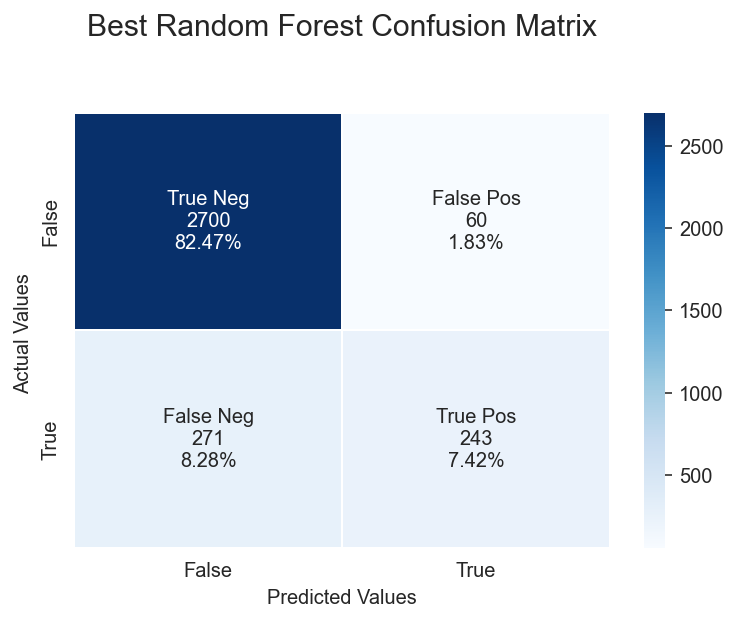

In [84]:
rf_cm = confusion_matrix(y_test, rf_pred)

group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']

group_sum = ['{0:0.0F}'.format(value) for value in rf_cm.flatten()]

group_percent = ['{0:.2%}'.format(value) for value in 
                 rf_cm.flatten()/np.sum(rf_cm)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in
         zip(group_names, group_sum, group_percent)]

labels = np.asarray(labels).reshape(2,2)

ax = sns.heatmap(rf_cm, annot=labels, fmt='', linewidths=0.75, cmap='Blues')

ax.set_title(f'Best {model_name} Confusion Matrix\n\n', size=15);
ax. set_xlabel("Predicted Values")
ax. set_ylabel('Actual Values ');
#
# Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False', 'True'])
ax.yaxis.set_ticklabels(['False', 'True']);

In [85]:
print(f'Best {model_name} model saved!')
tuned_rf_model = rf_rs.best_estimator_
tuned_rf_model

Best Random Forest model saved!


Pipeline(memory=None,
         steps=[('preprocessing',
                 ColumnTransformer(n_jobs=None, remainder='passthrough',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('categorical features',
                                                  Pipeline(memory=None,
                                                           steps=[('oridnal_encode',
                                                                   OrdinalEncoder(categories='auto',
                                                                                  dtype=<class 'numpy.float64'>,
                                                                                  handle_unknown='use_encoded_value',
                                                                                  unknown_value=-1))],
                                                           verbo...
                 RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                        class_weight=None, criterion='gini',
                                        max_depth=5, max_features='log2',
                                        max_leaf_nodes=None, max_samples=None,
                                        min_impurity_decrease=0.0,
                                        min_samples_leaf=3, min_samples_split=3,
                                        min_weight_fraction_leaf=0.0,
                                        n_estimators=380, n_jobs=None,
                                        oob_score=False, random_state=999,
                                        verbose=0, warm_start=False))],
         verbose=False)

### Tune XBoost Model

In [86]:
# Define model pipeline 
xgb_pipe = Pipeline([
    ('preprocessing', ct),
    ('model', XGBClassifier(random_state=999, use_label_encoder=False))
])

# Define model pipeline parameter grid
xgb_param_grid = {
    'model__max_depth': np.arange(2, 6),
    'model__learning_rate': np.logspace(-4, 0),
    'model__reg_alpha': [0, 0.1, 0.2],
    'model__gamma': [0, 1, 2],
    'model__n_estimators': np.arange(100, 1000)
}

In [87]:
%%time
xgb_rs = RandomizedSearchCV(estimator=xgb_pipe,
                            param_distributions=xgb_param_grid,
                            n_iter=10,
                            scoring=metric,
                            n_jobs=-1,
                            cv=skfold,
                            verbose=1,
                            random_state=999,
                            error_score='raise',
                            return_train_score=True)

xgb_rs.fit(X_train, y_train);

Fitting 10 folds for each of 10 candidates, totalling 100 fits
[12:23:43] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1637426408905/work/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
CPU times: user 10.2 s, sys: 334 ms, total: 10.6 s
Wall time: 3min 17s


RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=999, shuffle=True),
                   error_score='raise',
                   estimator=Pipeline(memory=None,
                                      steps=[('preprocessing',
                                              ColumnTransformer(n_jobs=None,
                                                                remainder='passthrough',
                                                                sparse_threshold=0.3,
                                                                transformer_weights=None,
                                                                transformers=[('categorical '
                                                                               'features',
                                                                               Pipeline(memory=None,
                                                                                        steps=[('oridnal_encode',
                                                                                                OrdinalEn...
       945, 946, 947, 948, 949, 950, 951, 952, 953, 954, 955, 956, 957,
       958, 959, 960, 961, 962, 963, 964, 965, 966, 967, 968, 969, 970,
       971, 972, 973, 974, 975, 976, 977, 978, 979, 980, 981, 982, 983,
       984, 985, 986, 987, 988, 989, 990, 991, 992, 993, 994, 995, 996,
       997, 998, 999]),
                                        'model__reg_alpha': [0, 0.1, 0.2]},
                   pre_dispatch='2*n_jobs', random_state=999, refit=True,
                   return_train_score=True, scoring='roc_auc', verbose=1)

In [88]:
xgb_best_params = xgb_rs.best_params_
xgb_best_score = xgb_rs.best_score_

model_name = 'XBoost'
print(f'Best parameters for {model_name} model:\n{xgb_best_params}\n')
print(f'Best mean CV ROC-AUC score: {(xgb_best_score * 100):.2f}%')

Best parameters for XBoost model:
{'model__reg_alpha': 0.1, 'model__n_estimators': 290, 'model__max_depth': 4, 'model__learning_rate': 0.02811768697974228, 'model__gamma': 2}

Best mean CV ROC-AUC score: 92.92%


In [89]:
print(f'{model_name} model results:')
xgb_results = pd.DataFrame(xgb_rs.cv_results_).sort_values(by='rank_test_score', ascending=True)
xgb_results.head()

XBoost model results:


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__reg_alpha,param_model__n_estimators,param_model__max_depth,param_model__learning_rate,param_model__gamma,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
7,8.650929,0.115144,0.011857,0.001690,0.1,290,4,0.028118,2,"{'model__reg_alpha': 0.1, 'model__n_estimators...",0.944708,0.915942,0.921623,0.931535,0.947554,0.939862,0.903222,0.919085,0.932361,0.935763,0.929165,0.013266,1,0.952631,0.956874,0.954747,0.956942,0.954927,0.955702,0.956021,0.956534,0.956471,0.955605,0.955645,0.001234
8,7.977062,0.159957,0.011774,0.000664,0.2,362,3,0.015999,1,"{'model__reg_alpha': 0.2, 'model__n_estimators...",0.937584,0.913179,0.921422,0.933676,0.947483,0.935895,0.904697,0.915973,0.932484,0.933800,0.927619,0.012526,2,0.939229,0.941283,0.941371,0.939803,0.938179,0.938707,0.942018,0.941291,0.940746,0.939786,0.940241,0.001221
0,19.512004,0.459226,0.013179,0.000962,0.1,737,4,0.033932,1,"{'model__reg_alpha': 0.1, 'model__n_estimators...",0.944177,0.915826,0.914933,0.927200,0.946584,0.937241,0.907919,0.913213,0.929199,0.932115,0.926841,0.012802,3,0.981893,0.973124,0.973113,0.976075,0.976085,0.981129,0.982618,0.979183,0.973271,0.977782,0.977427,0.003490
9,12.488661,2.463054,0.011618,0.001235,0.1,984,2,0.049417,1,"{'model__reg_alpha': 0.1, 'model__n_estimators...",0.939829,0.910973,0.916408,0.927976,0.949211,0.934381,0.904671,0.914453,0.931467,0.928888,0.925826,0.013222,4,0.943742,0.946042,0.944270,0.944343,0.941088,0.940157,0.942852,0.944875,0.944252,0.941305,0.943293,0.001791
3,29.876336,1.309599,0.014772,0.005416,0.1,892,4,0.000212,2,"{'model__reg_alpha': 0.1, 'model__n_estimators...",0.921170,0.904121,0.909097,0.922043,0.934899,0.931438,0.892204,0.905221,0.923626,0.931668,0.917549,0.013452,5,0.925602,0.924343,0.923972,0.926255,0.923021,0.925590,0.929756,0.924304,0.926306,0.925293,0.925444,0.001750


In [90]:
# Make predictions with best model estimator
xgb_pred = xgb_rs.best_estimator_.predict(X_test)
xgb_prob = xgb_rs.best_estimator_.predict_proba(X_test)[:, 1]

# Evaluate model predictions
xgb_roc_auc = roc_auc_score(y_test, xgb_prob) * 100
xgb_precision = precision_score(y_test, xgb_pred) * 100
xgb_recall = recall_score(y_test, xgb_pred) * 100
print(f'Best ROC-AUC test score: {xgb_roc_auc:.2f}%')
print(f'Best Precision test ccore: {xgb_precision:.2f}%')
print(f'Best Recall test score: {xgb_recall:.2f}%')

Best ROC-AUC test score: 93.23%
Best Precision test ccore: 74.52%
Best Recall test score: 60.89%


In [91]:
best_xgb_result = pd.DataFrame(columns=['CV ROC-AUC', 'ROC-AUC', 'Precision', 'Recall'], 
                                 index=['Tuned_XBoost'])

best_xgb_result.loc['Tuned_XBoost', 'CV ROC-AUC'] = round(xgb_best_score *100, 2)
best_xgb_result.loc['Tuned_XBoost', 'ROC-AUC'] = round(xgb_roc_auc, 2)
best_xgb_result.loc['Tuned_XBoost', 'Precision'] = round(xgb_precision, 2)
best_xgb_result.loc['Tuned_XBoost', 'Recall'] = round(xgb_recall, 2)
best_xgb_result

,CV ROC-AUC,ROC-AUC,Precision,Recall
Tuned_XBoost,92.92,93.23,74.52,60.89


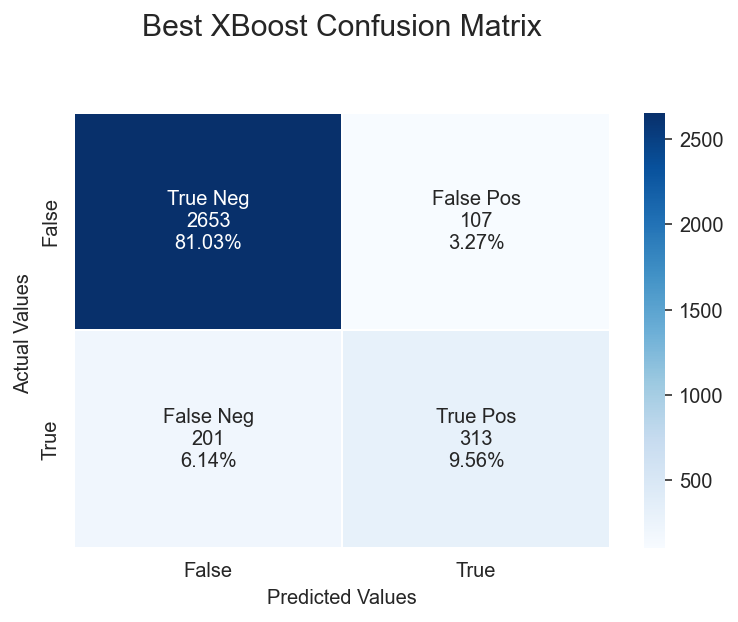

In [92]:
xgb_cm = confusion_matrix(y_test, xgb_pred)

group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']

group_sum = ['{0:0.0F}'.format(value) for value in xgb_cm.flatten()]

group_percent = ['{0:.2%}'.format(value) for value in 
                 xgb_cm.flatten()/np.sum(xgb_cm)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in
         zip(group_names, group_sum, group_percent)]

labels = np.asarray(labels).reshape(2,2)

ax = sns.heatmap(xgb_cm, annot=labels, fmt='', linewidths=0.75, cmap='Blues')

ax.set_title(f'Best {model_name} Confusion Matrix\n\n', size=15);
ax. set_xlabel("Predicted Values")
ax. set_ylabel('Actual Values ');
#
# Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False', 'True'])
ax.yaxis.set_ticklabels(['False', 'True']);

In [93]:
print(f'Best {model_name} model saved!')
tuned_xgb_model = xgb_rs.best_estimator_
tuned_xgb_model

Best XBoost model saved!


Pipeline(memory=None,
         steps=[('preprocessing',
                 ColumnTransformer(n_jobs=None, remainder='passthrough',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('categorical features',
                                                  Pipeline(memory=None,
                                                           steps=[('oridnal_encode',
                                                                   OrdinalEncoder(categories='auto',
                                                                                  dtype=<class 'numpy.float64'>,
                                                                                  handle_unknown='use_encoded_value',
                                                                                  unknown_value=-1))],
                                                           verbo...
                               max_delta_step=0, max_depth=4,
                               min_child_weight=1, missing=nan,
                               monotone_constraints='()', n_estimators=290,
                               n_jobs=8, num_parallel_tree=1,
                               objective='binary:logistic', predictor='auto',
                               random_state=999, reg_alpha=0.1, reg_lambda=1,
                               scale_pos_weight=1, subsample=1,
                               tree_method='exact', use_label_encoder=False,
                               validate_parameters=1, verbosity=None))],
         verbose=False)

## Compare Models Results

In [94]:
final_model_results = pd.concat([baseline_models_result, best_gbc_result, best_rf_result, best_xgb_result], axis=0)
final_model_results.sort_values(by=['CV ROC-AUC'], ascending=False, inplace=True)
final_model_results

,CV ROC-AUC,ROC-AUC,Precision,Recall
Tuned_XBoost,92.92,93.23,74.52,60.89
Baseline_GradientBoosting,92.79,92.97,72.16,60.51
Tuned_GradientBoosting,92.75,92.85,71.46,58.95
Baseline_RandomForest,91.91,92.69,73.88,57.78
Tuned_RandomForest,91.8,92.3,80.2,47.28
Baseline_XGBoost,91.29,92.04,69.77,58.37
Baseline_DecisionTree,73.4,73.57,53.52,56.23


In [95]:
final_model_results['CV ROC-AUC'].iplot(kind='bar',
                                        title='<b>Model Comparison by CV ROC-AUC<b>')

# Conclusions

We have developed a resuable model pipeline, the optimized model is able to solve the business problem of predicting a user puchase intent, if a user to the website will make a purchase or not. 

The model can be deployed - used to make predictions on new data. When integrated with other module to determine likelihood of visitor to leave the site (I mentioned in the beginning), the company can use this model to show individual special offers to such visitors before they leave the webstore.

Our Approach:

- We started out with a detailed exploratory data analysis of the data, analyzing the descriptive and target features.
- Next, we cleaned and prepared the data for machine learning.
- Split the data into training and testing sets
- We decided on models to use, our model evaluation strategy and metric selection
- We compare and evaluate models results.
- We inspect model predicitons on hold-out test set.

From the review of the fitted models above:
    
    - The best model is the Tuned_XGBoost 
    - The model achieves:
        - mean CV ROC-AUC score of 92.92%
        - ROC-AUC test score of 93.23%
        - Precision test score of 74.52%, meaning out of all users that the model thinks will make a purchase, 
          74.52% actually do
        - Recall test score of 60.89%, meaning the model is able to highlight 60.89% of those customers 
          who will make a purchase

The threshold that our model needs to reach depends on the business need. We can tune the model threshold to some extent to optimize for different metrics.

## Save Best Model

In [96]:
# Fit best model on all the data
tuned_xgb_model.fit(X, y);

[12:23:45] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1637426408905/work/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [97]:
import joblib
joblib.dump(tuned_xgb_model, '../03-model/website-visitor-purchase-intent-tuned-xgb-v1.pkl', compress=1)
print('Best Model Saved!!')

Best Model Saved!!


# Model Testing

In [98]:
# Load model
best_model = joblib.load('../03-model/website-visitor-purchase-intent-tuned-xgb-v1.pkl')
best_model

Pipeline(memory=None,
         steps=[('preprocessing',
                 ColumnTransformer(n_jobs=None, remainder='passthrough',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('categorical features',
                                                  Pipeline(memory=None,
                                                           steps=[('oridnal_encode',
                                                                   OrdinalEncoder(categories='auto',
                                                                                  dtype=<class 'numpy.float64'>,
                                                                                  handle_unknown='use_encoded_value',
                                                                                  unknown_value=-1))],
                                                           verbo...
                               max_delta_step=0, max_depth=4,
                               min_child_weight=1, missing=nan,
                               monotone_constraints='()', n_estimators=290,
                               n_jobs=8, num_parallel_tree=1,
                               objective='binary:logistic', predictor='auto',
                               random_state=999, reg_alpha=0.1, reg_lambda=1,
                               scale_pos_weight=1, subsample=1,
                               tree_method='exact', use_label_encoder=False,
                               validate_parameters=1, verbosity=None))],
         verbose=False)

In [99]:
# Import new unseen data
new_data = pd.read_csv('../02-data/website-visitor-purchase-intent-clean-test.csv')
print('The data has been successfully imported!')

The data has been successfully imported!


In [100]:
new_data.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,23,647.500000,0.028571,0.040000,0.000000,0.0,May,3,2,1,1,Returning_Visitor,0,0
1,6,95.6,0,0.0,12,582.733333,0.014286,0.035714,21.324134,0.0,Sep,2,2,8,7,Returning_Visitor,0,0
2,1,15.0,0,0.0,29,1397.500000,0.011556,0.046190,0.000000,0.8,May,2,4,7,3,Returning_Visitor,0,0
3,2,148.0,0,0.0,9,416.666667,0.000000,0.004545,0.000000,0.0,Mar,3,2,6,2,New_Visitor,1,0
4,0,0.0,0,0.0,26,781.500000,0.007692,0.030769,0.000000,0.2,May,2,2,2,3,Returning_Visitor,0,0


In [101]:
new_data.shape

(1213, 18)

In [102]:
# Partition the data into X and y
X_new = new_data.drop(['Revenue'], axis=1)
y_true = new_data['Revenue']
print('The shape of X_new:', X_new.shape)
print('The shape of y_true:', y_true.shape)

The shape of X_new: (1213, 17)
The shape of y_true: (1213,)


### Make Model Predictions

In [103]:
model_pred = best_model.predict(X_new)

### Evaluate Model Predictions

In [104]:
predictions = pd.DataFrame({'ModelPrediction': model_pred, 'ActualResult': y_true})
predictions.head()

,ModelPrediction,ActualResult
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0


In [105]:
# Evalute predictions
comparison = model_pred == y_true
np.unique(comparison, return_counts=True)

(array([False,  True]), array([ 108, 1105]))

### Classification Report

In [106]:
cr = classification_report(y_true, model_pred, target_names=['Purchase', 'Non-Purchase'])
print(f'Classification Report\n\n{cr}')

Classification Report

              precision    recall  f1-score   support

    Purchase       0.94      0.96      0.95      1034
Non-Purchase       0.74      0.62      0.67       179

    accuracy                           0.91      1213
   macro avg       0.84      0.79      0.81      1213
weighted avg       0.91      0.91      0.91      1213



### Confusion Matrix

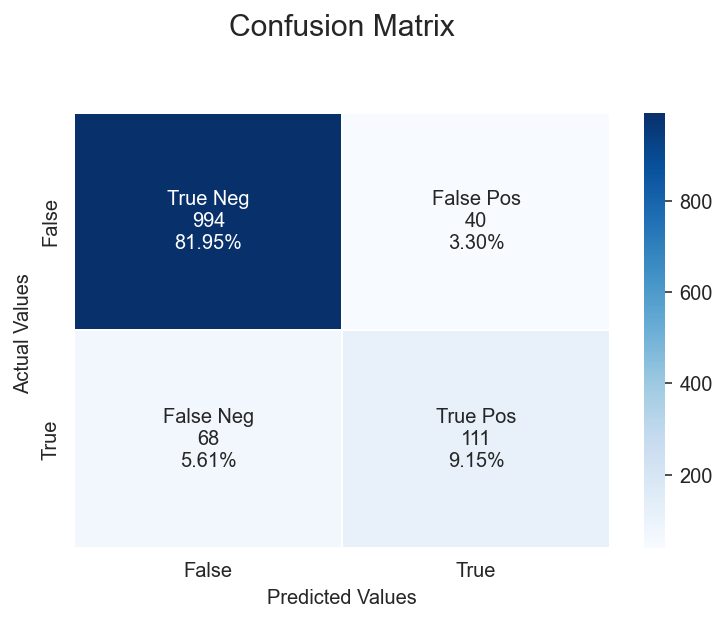

In [107]:
cm = confusion_matrix(y_true, model_pred)

group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']

group_sum = ['{0:0.0F}'.format(value) for value in cm.flatten()]

group_percent = ['{0:.2%}'.format(value) for value in 
                 cm.flatten()/np.sum(cm)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in
         zip(group_names, group_sum, group_percent)]

labels = np.asarray(labels).reshape(2,2)

ax = sns.heatmap(cm, annot=labels, fmt='', linewidths=0.75, cmap='Blues')

ax.set_title('Confusion Matrix\n\n', size=15);
ax. set_xlabel("Predicted Values")
ax. set_ylabel('Actual Values ');

# Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False', 'True'])
ax.yaxis.set_ticklabels(['False', 'True']);

In [108]:
# Save model predictions to csv
new_data['Revenue_ModelPrediction'] = model_pred
new_data.to_csv('../02-data/website-visitor-purchase-intent-clean-test-predictions.csv', index=False)
print('Model predictions has been successfully saved to csv file!')

Model predictions has been successfully saved to csv file!


# Reproducibility

In [109]:
%watermark -a 'Rainier Goubault' -n -m -v -iv 

Author: Rainier Goubault

Python implementation: CPython
Python version       : 3.9.7
IPython version      : 7.29.0

Compiler    : Clang 11.1.0 
OS          : Darwin
Release     : 21.1.0
Machine     : x86_64
Processor   : i386
CPU cores   : 8
Architecture: 64bit

json      : 2.0.9
plotly    : 5.4.0
joblib    : 1.1.0
numpy     : 1.21.4
cufflinks : 0.17.3
seaborn   : 0.11.2
matplotlib: 3.5.0
pandas    : 1.3.4
scipy     : 1.7.3

